In [1]:
import os
os.chdir('/home/wisc/maheswararao/code/stain2stain/stain2stain')

In [2]:
# Set device
import torch
# plot the images in a grid (10 rows x 3 columns)
import matplotlib.pyplot as plt
import numpy as np
import random
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


In [3]:
# from src.models.conditional_flow_matching import ConditionalFlowMatchingLitModule
from src.models.conditional_flow_matching_multitask import MultiTaskFlowMatchingLitModule
from src.data.paired_data_mask_he_amyloid import PairedHEIHCDataset
from torchcfm.models.unet import UNetModel
import hydra

In [4]:
ckpt_path = 'logs/train/runs/2026-01-22_16-15-43/checkpoints/best-169-0.4234.ckpt'
data_dir = "/data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/"

In [5]:
dataset = PairedHEIHCDataset(data_dir=data_dir, source_column='he_filepath', target_column='ihc_filepath', csv_file_name="dataset_nirschl_et_al_2026_metadata.csv", folder="train", image_size=512)


Loading paired HE-IHC dataset from:
  HE directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/train
  IHC directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/train
  Mask directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/train
  Number of paired images: 2256


In [6]:
from omegaconf import DictConfig, OmegaConf

# read config file
model_config = OmegaConf.load("configs/model/conditional_flow_matching_multitask.yaml")
flow_matcher = hydra.utils.instantiate(model_config)

/home/wisc/maheswararao/code/stain2stain/stain2stain/.venv/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:210: Attribute 'encoder' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['encoder'])`.
/home/wisc/maheswararao/code/stain2stain/stain2stain/.venv/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:210: Attribute 'flow_decoder' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['flow_decoder'])`.
/home/wisc/maheswararao/code/stain2stain/stain2stain/.venv/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:210: Attribute 'seg_decoder' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['seg_decoder'])`.


In [7]:
model = hydra.utils.instantiate(model_config)
model = model.to(device)
model.eval()
print("Model loaded successfully!")

Model loaded successfully!


In [8]:
checkpoint = torch.load(ckpt_path, map_location=device, weights_only=False)
model.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

In [15]:
def plot_image_grid(he_images, ihc_real_images, ihc_generated_images, masks, predicted_masks):
    n_images = len(he_images)
    
    fig, axs = plt.subplots(n_images, 5, figsize=(12, 35))

    for i in range(n_images):
        # HE Image
        he_np = he_images[i].permute(1, 2, 0).numpy()
        he_np = np.clip(he_np, 0, 1)  # Ensure values are in [0, 1] range
        axs[i, 0].imshow(he_np)
        axs[i, 0].set_title(f"HE Image {i+1}")
        axs[i, 0].axis('off')
        
        # Ground Truth IHC
        ihc_real_np = ihc_real_images[i].permute(1, 2, 0).numpy()
        ihc_real_np = np.clip(ihc_real_np, 0, 1)
        axs[i, 1].imshow(ihc_real_np)
        axs[i, 1].set_title(f"IHC Real {i+1}")
        axs[i, 1].axis('off')
        
        # Generated IHC
        ihc_gen_np = ihc_generated_images[i].permute(1, 2, 0).numpy()
        ihc_gen_np = np.clip(ihc_gen_np, 0, 1)
        axs[i, 2].imshow(ihc_gen_np)
        axs[i, 2].set_title(f"IHC Generated {i+1}")
        axs[i, 2].axis('off')

        # Ground Truth Mask
        mask_np = masks[i].permute(1, 2, 0).numpy()
        mask_np = np.clip(mask_np, 0, 255).astype(np.uint8)
        axs[i, 3].imshow(mask_np, cmap='gray')
        axs[i, 3].set_title(f"Mask Real {i+1}")
        axs[i, 3].axis('off')

        # Predicted Mask
        pred_mask_np = predicted_masks[i].permute(1, 2, 0).numpy()
        pred_mask_np = np.clip(pred_mask_np, 0, 255).astype(np.uint8)
        axs[i, 4].imshow(pred_mask_np, cmap='gray')
        axs[i, 4].set_title(f"Mask Predicted {i+1}")
        axs[i, 4].axis('off')

    plt.tight_layout()
    plt.show()

In [23]:
def generate_images(model, dataset, n_images=10,  num_steps=2):
    # Store results for plotting
    
    random_indices = random.sample(range(len(dataset)), n_images)

    # Store results for plotting
    he_images = []
    masks = []
    ihc_real_images = []
    ihc_generated_images = []
    predicted_masks = []

    # Generate predictions for all 10 images
    with torch.no_grad():
        for idx in random_indices:
            he_img, ihc_img, mask = dataset[idx]
            
            # Expand batch dimension
            he_img_batch = he_img.unsqueeze(0).to(device)
            ihc_img_batch = ihc_img.unsqueeze(0).to(device)
            
            # Generate IHC prediction
            ihc_generated, pred_mask = model.generate(he_img_batch, num_steps=num_steps)
            
            # Store on CPU for memory efficiency
            he_images.append(he_img.cpu())
            ihc_real_images.append(ihc_img.cpu())
            masks.append(mask.cpu()*255.0)
            ihc_generated_images.append(ihc_generated.squeeze(0).cpu())
            predicted_masks.append(pred_mask.squeeze(0).cpu()*255.0)
    return he_images, ihc_real_images, ihc_generated_images, masks, predicted_masks

Loading paired HE-IHC dataset from:
  HE directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/train
  IHC directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/train
  Mask directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/train
  Number of paired images: 2256


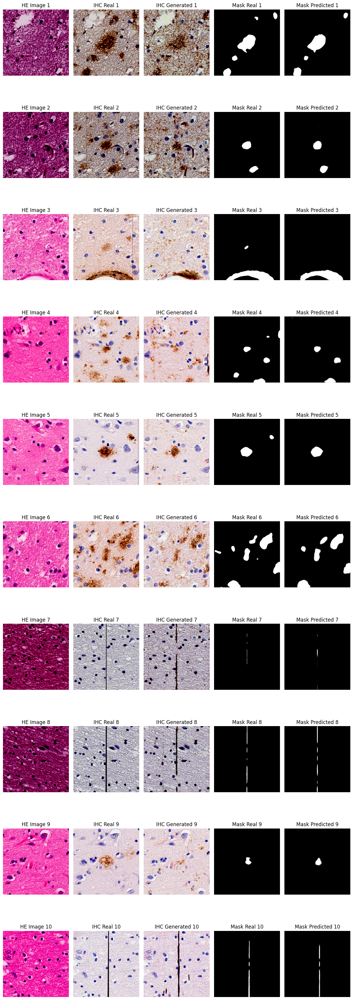

In [18]:
dataset = PairedHEIHCDataset(data_dir=data_dir, source_column='he_filepath', target_column='ihc_filepath', csv_file_name="dataset_nirschl_et_al_2026_metadata.csv", folder="train", image_size=512)
# dataconfig = OmegaConf.load("configs/data/paired_data_mask_he_amyloid.yaml")
# data_module = hydra.utils.instantiate(dataconfig)
he_images, ihc_real_images, ihc_generated_images, masks, predicted_masks = generate_images(model, dataset, n_images=10)
plot_image_grid(he_images, ihc_real_images, ihc_generated_images, masks, predicted_masks)

Loading paired HE-IHC dataset from:
  HE directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/val
  IHC directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/val
  Mask directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/val
  Number of paired images: 236


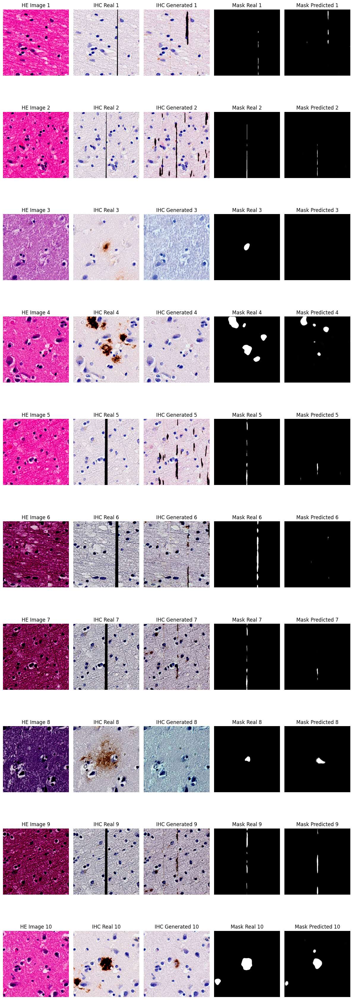

In [24]:
dataset = PairedHEIHCDataset(data_dir=data_dir, source_column='he_filepath', target_column='ihc_filepath', csv_file_name="dataset_nirschl_et_al_2026_metadata.csv", folder="val", image_size=512)
# dataconfig = OmegaConf.load("configs/data/paired_data_mask_he_amyloid.yaml")
# data_module = hydra.utils.instantiate(dataconfig)
he_images, ihc_real_images, ihc_generated_images, masks, predicted_masks = generate_images(model, dataset, n_images=10, num_steps=10)
plot_image_grid(he_images, ihc_real_images, ihc_generated_images, masks, predicted_masks)

Loading paired HE-IHC dataset from:
  HE directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/test
  IHC directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/test
  Mask directory: /data1/shared/data/destain_restain/he_amyloid/positive_crops/flow_matching/test
  Number of paired images: 764


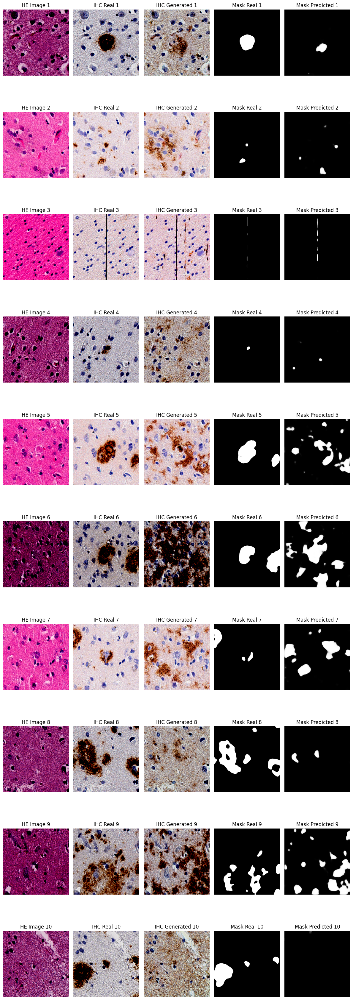

In [25]:
dataset = PairedHEIHCDataset(data_dir=data_dir, source_column='he_filepath', target_column='ihc_filepath', csv_file_name="dataset_nirschl_et_al_2026_metadata.csv", folder="test", image_size=512)
# dataconfig = OmegaConf.load("configs/data/paired_data_mask_he_amyloid.yaml")
# data_module = hydra.utils.instantiate(dataconfig)
he_images, ihc_real_images, ihc_generated_images, masks, predicted_masks = generate_images(model, dataset, n_images=10, num_steps=2)
plot_image_grid(he_images, ihc_real_images, ihc_generated_images, masks, predicted_masks)